In [1]:
import pandas as pd
from palletjack import extract
import logging

In [2]:
logging.basicConfig(level=logging.DEBUG)

In [3]:
rest_extractor = extract.RESTServiceLoader("https://services1.arcgis.com/taguadKoI1XFwivx/arcgis/rest/services/hui_for_web2_gdb/FeatureServer/")

In [4]:
hui_layer = extract.ServiceLayer("https://services1.arcgis.com/taguadKoI1XFwivx/arcgis/rest/services/hui_for_web2_gdb/FeatureServer/0", timeout=10)
max_record_count = hui_layer.max_record_count 
hui = rest_extractor.get_features(hui_layer, 200)

DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): services1.arcgis.com:443
DEBUG:urllib3.connectionpool:https://services1.arcgis.com:443 "GET /taguadKoI1XFwivx/arcgis/rest/services/hui_for_web2_gdb/FeatureServer/0?f=json HTTP/11" 200 2949
INFO:palletjack.extract.RESTServiceLoader:Getting features from https://services1.arcgis.com/taguadKoI1XFwivx/arcgis/rest/services/hui_for_web2_gdb/FeatureServer/0...
DEBUG:palletjack.extract.RESTServiceLoader:Checking for query capability...
DEBUG:palletjack.extract.RESTServiceLoader:Getting object ids...
DEBUG:palletjack.extract.ServiceLayer:OID params: {'returnIdsOnly': 'true', 'f': 'json', 'where': '1=1'}
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): services1.arcgis.com:443
DEBUG:urllib3.connectionpool:https://services1.arcgis.com:443 "GET /taguadKoI1XFwivx/arcgis/rest/services/hui_for_web2_gdb/FeatureServer/0/query?returnIdsOnly=true&f=json&where=1%3D1 HTTP/11" 200 2082592
DEBUG:palletjack.extract.RESTServiceLoade

In [5]:
hui.spatial.sr

{'wkid': 102100, 'latestWkid': 3857}

In [6]:
hui.spatial.to_featureclass(r"C:\gis\Projects\HousingInventory\HousingInventory.gdb\wfrc_update_2024_12_17_orig")

'C:\\gis\\Projects\\HousingInventory\\HousingInventory.gdb\\wfrc_update_2024_12_17_orig'

In [11]:
hui["BLT_DECADE"] = hui["APX_BLT_YR"] // 10 * 10
hui["COUNTY"] = hui["COUNTY"].apply(lambda x: x if x != "Box Elder (MPO Area)" else "Box Elder")

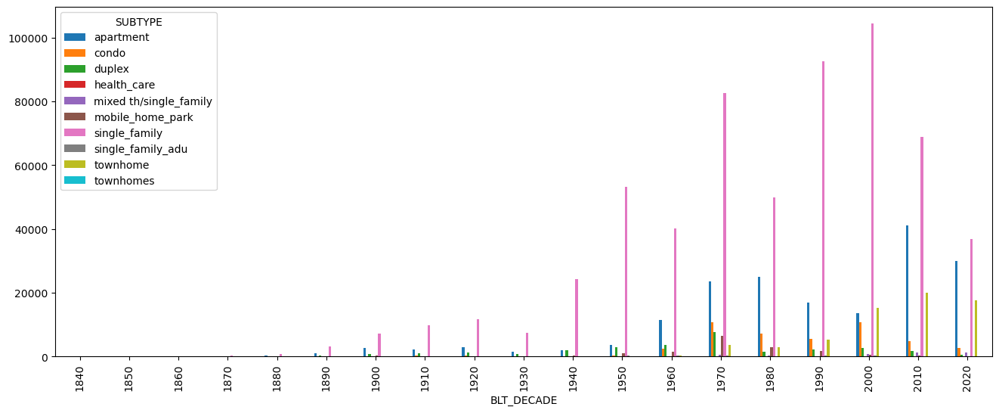

In [ ]:
subtype = hui.groupby(["BLT_DECADE", "SUBTYPE"])["UNIT_COUNT"].sum()
ax = subtype.unstack().plot(kind="bar", stacked=False, figsize=(16, 6))

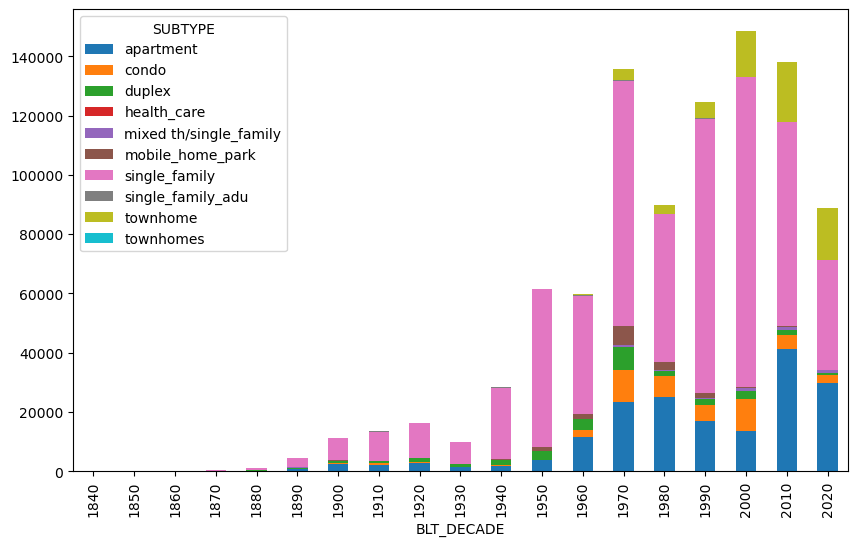

In [42]:
ax = subtype.unstack().plot(kind="bar", stacked=True, figsize=(10, 6))

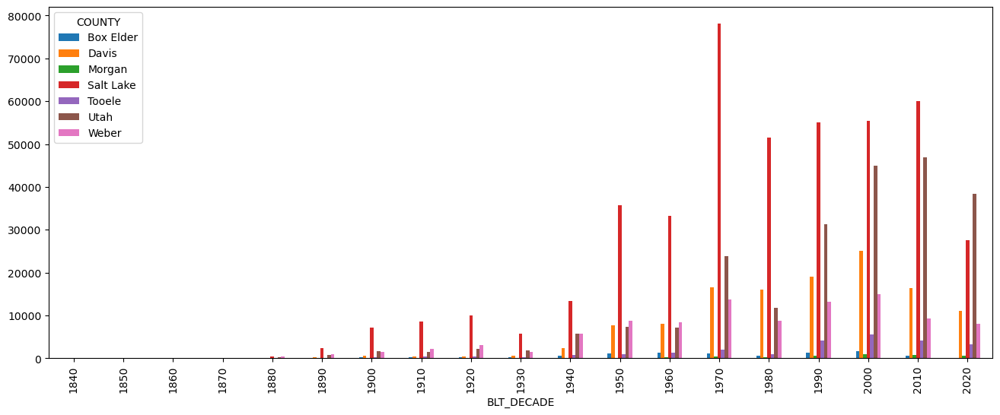

In [51]:
county_decade_sums = hui.groupby(["BLT_DECADE", "COUNTY"])["UNIT_COUNT"].sum()
ax = county_decade_sums.unstack().plot(kind="bar", stacked=False, figsize=(16, 6))

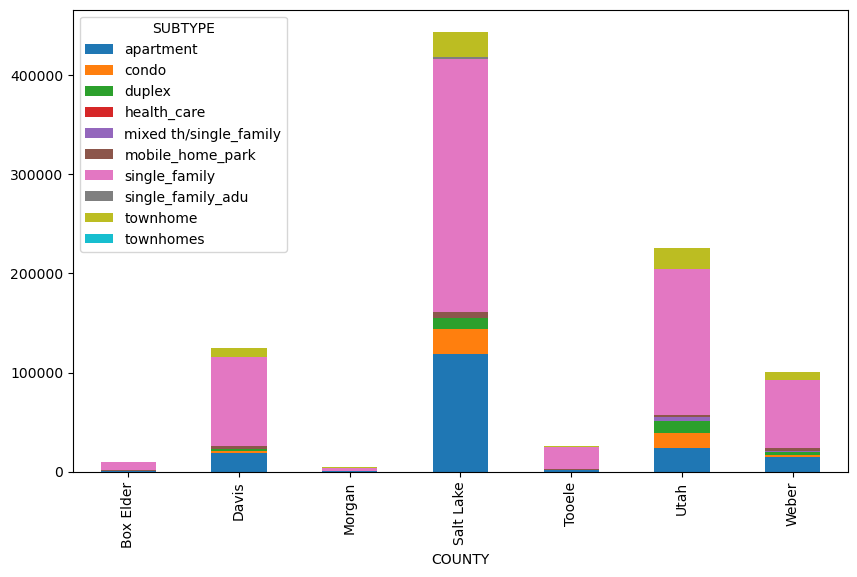

In [47]:
county_type_sums = hui.groupby(["COUNTY", "SUBTYPE"])["UNIT_COUNT"].sum()
ax = county_type_sums.unstack().plot(kind="bar", stacked=True, figsize=(10, 6))

In [38]:
hui.groupby(["SUBTYPE"])["COUNTY"].value_counts()

SUBTYPE                 COUNTY   
apartment               Salt Lake      3968
                        Utah           1281
                        Weber           784
                        Davis           701
                        Tooele           66
                        Box Elder        63
                        Morgan           11
condo                   Utah          14843
                        Salt Lake       439
                        Weber            70
                        Davis            25
                        Tooele            7
                        Box Elder         5
                        Morgan            1
duplex                  Utah           5983
                        Salt Lake      5432
                        Weber          1478
                        Davis           483
                        Tooele          137
                        Morgan           64
                        Box Elder        51
health_care             Weber             

In [50]:
hui.spatial.to_featureclass(r"C:\gis\Projects\HousingInventory\HousingInventory.gdb\wfrc_update_2024_12_17_cleaned")

'C:\\gis\\Projects\\HousingInventory\\HousingInventory.gdb\\wfrc_update_2024_12_17_cleaned'

In [53]:
hui["VINTAGE"].value_counts()

VINTAGE
2024    606340
2020      8639
Name: count, dtype: Int64

# 2024-12-31: Blog Post

In [2]:
import arcgis

In [3]:
gis = arcgis.gis.GIS()
hui_item = gis.content.get("bbdc62867c2340949f530a71666223ab")
hui_feature_layer = hui_item.layers[0]
hui_dataframe = hui_feature_layer.query(return_geometry=False, as_df=True)
hui_dataframe.head()

,OBJECTID,UNIT_ID,TYPE,SUBTYPE,IS_OUG,UNIT_COUNT,DUA,ACRES,TOT_BD_FT2,TOT_VALUE,APX_BLT_YR,BLT_DECADE,CITY,COUNTY,SUBCOUNTY,EVAL_DATE,Shape__Area,Shape__Length
0,1,0,single_family,single_family,1,11.0,1.282095,8.579707,18703.0,8678200.0,2000.0,2000,Springdale,Washington,<NA>,2024-01-22 12:00:00,54805.101562,1876.450253
1,2,1,single_family,single_family,1,9.0,0.377838,23.819754,14931.0,5327500.0,2019.0,2010,Springdale,Washington,<NA>,2024-01-22 12:00:00,152061.308594,1793.792754
2,3,2,single_family,single_family,1,77.0,0.285765,269.452534,104143.0,38757200.0,2020.0,2020,Springdale,Washington,<NA>,2024-01-22 12:00:00,1720329.394531,16241.656591
3,4,3,single_family,townhome,1,20.0,5.276712,3.790239,28991.0,15922500.0,2014.0,2010,Springdale,Washington,<NA>,2024-01-22 12:00:00,24212.292969,842.041499
4,5,4,single_family,single_family,1,35.0,4.769242,7.338692,66824.0,15567700.0,2005.0,2000,La Verkin,Washington,<NA>,2024-01-22 12:00:00,46902.328125,2178.451048


In [4]:
hui_dataframe["SUBTYPE"].value_counts()

SUBTYPE
single_family             622787
townhome                   23150
condo                      15431
duplex                     14014
apartment                   7166
mobile_home_park            2337
single_family_adu           1957
mixed th/single_family      1423
                               3
townhomes                      1
health_care                    1
Name: count, dtype: Int64

In [5]:
hui_dataframe.groupby(["SUBTYPE"])["UNIT_COUNT"].sum().sort_values(ascending=False)

SUBTYPE
single_family             655748.0
apartment                 183879.0
townhome                   75031.0
condo                      47550.0
duplex                     30080.0
mobile_home_park           20422.0
mixed th/single_family      4629.0
single_family_adu           1958.0
                             235.0
townhomes                     15.0
health_care                    1.0
Name: UNIT_COUNT, dtype: Float64

<AxesSubplot: xlabel='SUBTYPE'>

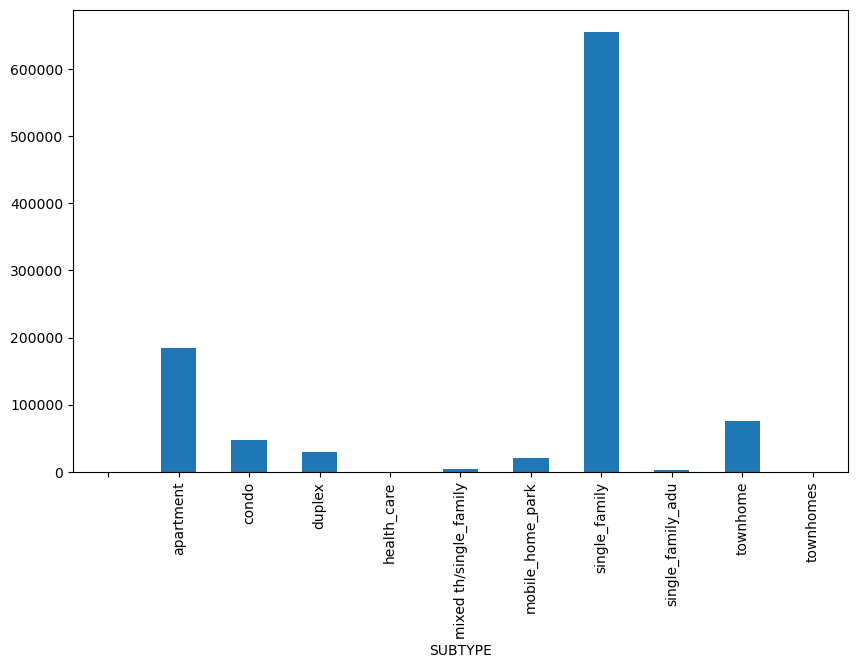

In [5]:
hui_dataframe.groupby(["SUBTYPE"])["UNIT_COUNT"].sum().plot(kind="bar", figsize=(10, 6))

In [14]:
hui_dataframe.groupby(["BLT_DECADE", "SUBTYPE"])["UNIT_COUNT"].sum()

BLT_DECADE  SUBTYPE          
1840        apartment                4.0
            single_family            2.0
1850        apartment                6.0
            single_family           21.0
1860        apartment               23.0
                                  ...   
2020        mobile_home_park        21.0
            single_family        42714.0
            single_family_adu       10.0
            townhome             20175.0
            townhomes               15.0
Name: UNIT_COUNT, Length: 127, dtype: Float64

<AxesSubplot: xlabel='BLT_DECADE,SUBTYPE'>

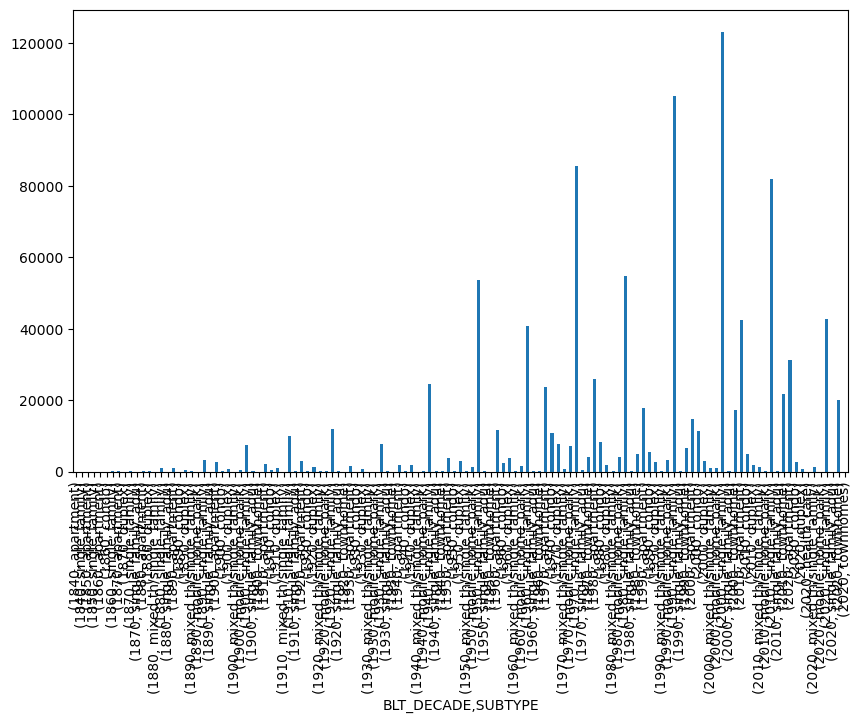

In [15]:
hui_dataframe.groupby(["BLT_DECADE", "SUBTYPE"])["UNIT_COUNT"].sum().plot(kind="bar", figsize=(10, 6))

In [16]:
#: Unstack: Take a series of values that has a multi-level index with categorical values in each level and use the values of one of the index levels as column names for the original series' values to reside in, creating a 2d table

hui_dataframe.groupby(["BLT_DECADE", "SUBTYPE"])["UNIT_COUNT"].sum().unstack()

SUBTYPE,apartment,single_family,condo,duplex,single_family_adu,mixed th/single_family,mobile_home_park,townhome,health_care,townhomes
BLT_DECADE,,,,,,,,,,
1840,4.0,2.0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
1850,6.0,21.0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
1860,23.0,105.0,1.0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
1870,40.0,250.0,<NA>,18.0,2.0,<NA>,<NA>,<NA>,<NA>,<NA>
1880,193.0,888.0,<NA>,116.0,3.0,1.0,<NA>,<NA>,<NA>,<NA>
1890,909.0,3155.0,5.0,341.0,27.0,35.0,2.0,<NA>,<NA>,<NA>
1900,2571.0,7377.0,163.0,810.0,56.0,13.0,357.0,9.0,<NA>,<NA>
1910,2250.0,9917.0,394.0,930.0,82.0,20.0,<NA>,<NA>,<NA>,<NA>
1920,2860.0,11984.0,286.0,1203.0,121.0,30.0,39.0,15.0,<NA>,<NA>


<AxesSubplot: xlabel='BLT_DECADE'>

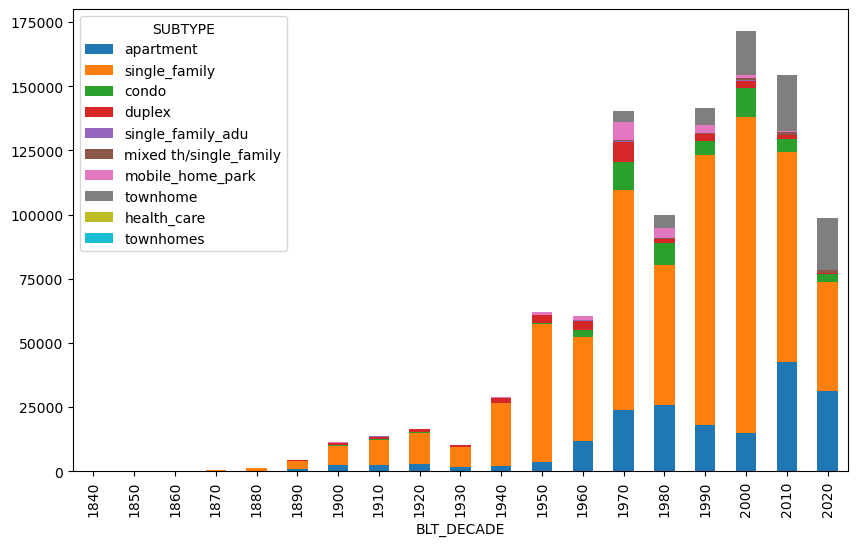

In [20]:
hui_dataframe.groupby(["BLT_DECADE", "SUBTYPE"])["UNIT_COUNT"].sum().unstack().plot(kind="bar", stacked=True, figsize=(10, 6))

In [18]:
hui_dataframe.groupby(["BLT_DECADE", "SUBTYPE"])["UNIT_COUNT"].sum().reset_index()

,BLT_DECADE,SUBTYPE,UNIT_COUNT
0,1840,apartment,4.0
1,1840,single_family,2.0
2,1850,apartment,6.0
3,1850,single_family,21.0
4,1860,apartment,23.0
...,...,...,...
122,2020,mobile_home_park,21.0
123,2020,single_family,42714.0
124,2020,single_family_adu,10.0
125,2020,townhome,20175.0


In [22]:
#: Pivot: Use the categorical values in one column as column names to widen out a table of values, using a second column of categorical values as the new index. 
#: THIS ISN'T QUITE RIGHT BUT CLOSE- FIGURE OUT HOW TO SAY THIS: Basically the same as resetting the index of the multi-indexed series necessary for unstacking.

hui_dataframe.groupby(["BLT_DECADE", "SUBTYPE"])["UNIT_COUNT"].sum().reset_index().pivot(index="BLT_DECADE", columns="SUBTYPE", values="UNIT_COUNT")


SUBTYPE,apartment,condo,duplex,health_care,mixed th/single_family,mobile_home_park,single_family,single_family_adu,townhome,townhomes
BLT_DECADE,,,,,,,,,,
1840,4.0,<NA>,<NA>,<NA>,<NA>,<NA>,2.0,<NA>,<NA>,<NA>
1850,6.0,<NA>,<NA>,<NA>,<NA>,<NA>,21.0,<NA>,<NA>,<NA>
1860,23.0,1.0,<NA>,<NA>,<NA>,<NA>,105.0,<NA>,<NA>,<NA>
1870,40.0,<NA>,18.0,<NA>,<NA>,<NA>,250.0,2.0,<NA>,<NA>
1880,193.0,<NA>,116.0,<NA>,1.0,<NA>,888.0,3.0,<NA>,<NA>
1890,909.0,5.0,341.0,<NA>,35.0,2.0,3155.0,27.0,<NA>,<NA>
1900,2571.0,163.0,810.0,<NA>,13.0,357.0,7377.0,56.0,9.0,<NA>
1910,2250.0,394.0,930.0,<NA>,20.0,<NA>,9917.0,82.0,<NA>,<NA>
1920,2860.0,286.0,1203.0,<NA>,30.0,39.0,11984.0,121.0,15.0,<NA>


In [23]:
#: Pivot Table: Allows you to do an aggregation function on numerical data. In our example, this eliminates the need for the groupby/sum operation.

pd.pivot_table(hui_dataframe, values="UNIT_COUNT", index="BLT_DECADE", columns="SUBTYPE", aggfunc="sum")

SUBTYPE,apartment,condo,duplex,health_care,mixed th/single_family,mobile_home_park,single_family,single_family_adu,townhome,townhomes
BLT_DECADE,,,,,,,,,,
1840,4.0,<NA>,<NA>,<NA>,<NA>,<NA>,2.0,<NA>,<NA>,<NA>
1850,6.0,<NA>,<NA>,<NA>,<NA>,<NA>,21.0,<NA>,<NA>,<NA>
1860,23.0,1.0,<NA>,<NA>,<NA>,<NA>,105.0,<NA>,<NA>,<NA>
1870,40.0,<NA>,18.0,<NA>,<NA>,<NA>,250.0,2.0,<NA>,<NA>
1880,193.0,<NA>,116.0,<NA>,1.0,<NA>,888.0,3.0,<NA>,<NA>
1890,909.0,5.0,341.0,<NA>,35.0,2.0,3155.0,27.0,<NA>,<NA>
1900,2571.0,163.0,810.0,<NA>,13.0,357.0,7377.0,56.0,9.0,<NA>
1910,2250.0,394.0,930.0,<NA>,20.0,<NA>,9917.0,82.0,<NA>,<NA>
1920,2860.0,286.0,1203.0,<NA>,30.0,39.0,11984.0,121.0,15.0,<NA>


<AxesSubplot: xlabel='BLT_DECADE'>

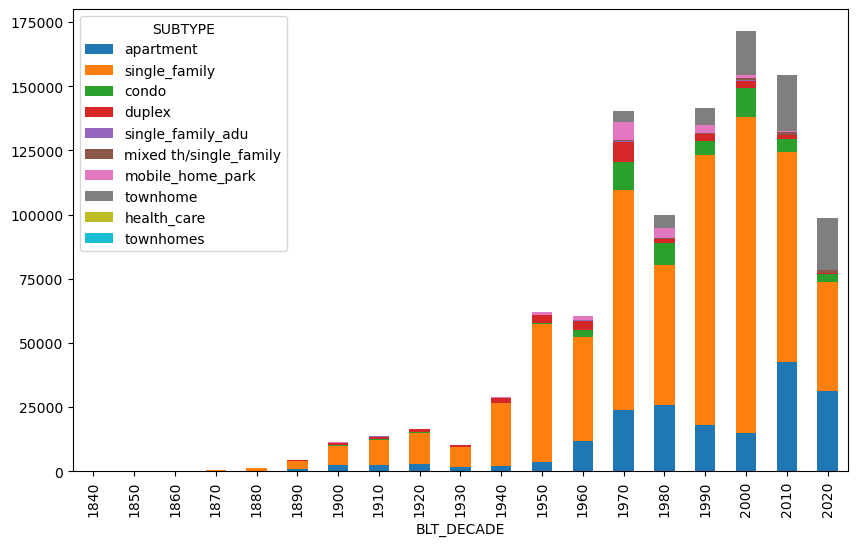

In [13]:
hui_dataframe.groupby(["BLT_DECADE", "SUBTYPE"])["UNIT_COUNT"].sum().unstack().plot(kind="bar", stacked=True, figsize=(10, 6))